# Install Requirements for AWS SageMaker

In [1]:
pip install gdown

Note: you may need to restart the kernel to use updated packages.


In [2]:
!pip install ipython-autotime
%load_ext autotime

time: 424 µs (started: 2021-12-04 23:16:44 +00:00)


In [3]:
pip install gensim

Note: you may need to restart the kernel to use updated packages.
time: 1.32 s (started: 2021-12-04 23:17:18 +00:00)


In [4]:
pip install pandas

Note: you may need to restart the kernel to use updated packages.
time: 1.61 s (started: 2021-12-04 23:17:20 +00:00)


In [5]:
pip install -U scikit-learn

Note: you may need to restart the kernel to use updated packages.
time: 1.57 s (started: 2021-12-04 23:17:21 +00:00)


In [6]:
pip install torch torchvision torchaudio

Note: you may need to restart the kernel to use updated packages.
time: 1.22 s (started: 2021-12-04 23:17:23 +00:00)


In [7]:
pip install tables

Note: you may need to restart the kernel to use updated packages.
time: 1.28 s (started: 2021-12-04 23:17:24 +00:00)


In [8]:
pip install matplotlib

Note: you may need to restart the kernel to use updated packages.
time: 1.38 s (started: 2021-12-04 23:17:26 +00:00)


# Loading Models

In [9]:
# Do not execute if loading the embeddings from drive
! wget -c "https://s3.amazonaws.com/dl4j-distribution/GoogleNews-vectors-negative300.bin.gz"
! gdown 'https://drive.google.com/uc?id=15qqiiENEWU6UuhKb4k1JDiPKsW4GJAaw'

--2021-12-04 23:17:38--  https://s3.amazonaws.com/dl4j-distribution/GoogleNews-vectors-negative300.bin.gz
Resolving s3.amazonaws.com (s3.amazonaws.com)... 52.217.1.102
Connecting to s3.amazonaws.com (s3.amazonaws.com)|52.217.1.102|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1647046227 (1.5G) [application/x-gzip]
Saving to: 'GoogleNews-vectors-negative300.bin.gz'

               Goog  38%[======>             ] 603.61M  78.0MB/s    eta 19s    ^C
Downloading...
From: https://drive.google.com/uc?id=15qqiiENEWU6UuhKb4k1JDiPKsW4GJAaw
To: /home/studio-lab-user/project/glove.6B.300d.word2vec
 14%|█████▎                                 | 143M/1.04G [00:02<00:10, 89.3MB/s]^C
Traceback (most recent call last):
  File "/home/studio-lab-user/.conda/envs/default/bin/gdown", line 8, in <module>
    sys.exit(main())
  File "/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/gdown/cli.py", line 145, in main
    filename = download(
  File "/home/studio-l

# Load Utils and data

In [ ]:
! gdown 'https://drive.google.com/uc?id=1zTDcgnFtQWUeXgIce4O2Z2OPn0vJH1aD'

Downloading...
From: https://drive.google.com/uc?id=1zTDcgnFtQWUeXgIce4O2Z2OPn0vJH1aD
To: /content/utils_py.py
100% 6.69k/6.69k [00:00<00:00, 6.00MB/s]


In [ ]:
pip install transformers

     |████████████████████████████████| 3.1 MB 5.2 MB/s 
     |████████████████████████████████| 3.3 MB 36.5 MB/s 
     |████████████████████████████████| 61 kB 505 kB/s 
     |████████████████████████████████| 596 kB 34.9 MB/s 
     |████████████████████████████████| 895 kB 51.2 MB/s 
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
!pip install ipython-autotime
%load_ext autotime

time: 140 µs (started: 2021-12-04 15:14:26 +00:00)


In [ ]:
! gdown "https://drive.google.com/uc?id=1PSjnBVZM_hmM0jtQrZ7QNuzTeWDTPuHM"
! gdown "https://drive.google.com/uc?id=1hZmVoYIyrY_oIFYe_zA3oPFkttom8Kc1"
! gdown "https://drive.google.com/uc?id=1vKduM6oCoGWWiXZrn1P33rnu74YbJJ2T"

Downloading...
From: https://drive.google.com/uc?id=1PSjnBVZM_hmM0jtQrZ7QNuzTeWDTPuHM
To: /content/bbc.csv
100% 5.10M/5.10M [00:00<00:00, 78.6MB/s]
Downloading...
From: https://drive.google.com/uc?id=1hZmVoYIyrY_oIFYe_zA3oPFkttom8Kc1
To: /content/classic3.csv
100% 3.84M/3.84M [00:00<00:00, 60.5MB/s]
Downloading...
From: https://drive.google.com/uc?id=1vKduM6oCoGWWiXZrn1P33rnu74YbJJ2T
To: /content/classic4.csv
100% 5.02M/5.02M [00:00<00:00, 78.9MB/s]
time: 8.28 s (started: 2021-12-04 15:14:26 +00:00)


In [ ]:
from gensim.models import KeyedVectors
import pandas as pd
import numpy as np
import warnings
import re

from utils_py import static_document_embeddings, tokenize_re

time: 9.11 s (started: 2021-12-04 15:14:35 +00:00)


In [ ]:
df = pd.read_csv("./classic4.csv")
df
texts = df['text'].values
classic4_labels = df["label"].values
k_classic4 = len(df['label'].unique())
print(k_classic4)
df.info()

4
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7095 entries, 0 to 7094
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  7095 non-null   int64 
 1   text        7095 non-null   object
 2   label       7095 non-null   object
dtypes: int64(1), object(2)
memory usage: 166.4+ KB
time: 79.2 ms (started: 2021-12-04 15:14:44 +00:00)


In [ ]:
df_bbc = pd.read_csv("./bbc.csv")
df_bbc
texts_bbc = df_bbc['text'].values
bbc_labels = df_bbc["label"].values
k_bbc = len(df['label'].unique())
print(k_bbc)
df_bbc.info()

4
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2225 entries, 0 to 2224
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  2225 non-null   int64 
 1   text        2225 non-null   object
 2   label       2225 non-null   object
dtypes: int64(1), object(2)
memory usage: 52.3+ KB
time: 55 ms (started: 2021-12-04 15:14:44 +00:00)


# Embeddings

## Load from Drive to save RAM and time

Read the embeddings saved before on Google Drive

### word2vec

In [ ]:
! gdown "https://drive.google.com/uc?id=1270jrqfjC_j9jbujB8n6bTovnqCBG1Xp"
! gdown "https://drive.google.com/uc?id=1--FNn99G1Uut0R1v6mFqiuBi_pG-jC6o"

Downloading...
From: https://drive.google.com/uc?id=1270jrqfjC_j9jbujB8n6bTovnqCBG1Xp
To: /content/classic4_word2vec.h5
100% 17.1M/17.1M [00:00<00:00, 79.7MB/s]
Downloading...
From: https://drive.google.com/uc?id=1--FNn99G1Uut0R1v6mFqiuBi_pG-jC6o
To: /content/bbc_word2vec.h5
100% 2.70M/2.70M [00:00<00:00, 85.2MB/s]
time: 8.49 s (started: 2021-12-04 15:14:44 +00:00)


In [ ]:
classic4_word2vec = pd.read_hdf("classic4_word2vec.h5").to_numpy()
bbc_word2vec = pd.read_hdf("bbc_word2vec.h5").to_numpy()

time: 385 ms (started: 2021-12-04 15:14:53 +00:00)


### glove

In [ ]:
! gdown "https://drive.google.com/uc?id=1-04KQb6ykGW20yXI8dSZk5YJQKT2CRGh"
! gdown "https://drive.google.com/uc?id=1-0eXYefFHTliAuFfrRX8g2gnkYlF3Z5H"

Downloading...
From: https://drive.google.com/uc?id=1-04KQb6ykGW20yXI8dSZk5YJQKT2CRGh
To: /content/bbc_glove.h5
100% 2.70M/2.70M [00:00<00:00, 86.6MB/s]
Downloading...
From: https://drive.google.com/uc?id=1-0eXYefFHTliAuFfrRX8g2gnkYlF3Z5H
To: /content/classic4_glove.h5
100% 17.1M/17.1M [00:00<00:00, 104MB/s]
time: 7.18 s (started: 2021-12-04 15:14:53 +00:00)


In [ ]:
classic4_glove = pd.read_hdf("classic4_glove.h5").to_numpy()
bbc_glove = pd.read_hdf("bbc_glove.h5").to_numpy()

time: 58.4 ms (started: 2021-12-04 15:15:00 +00:00)


## Word2Vec

In [ ]:
word2vec_model = KeyedVectors.load_word2vec_format("./GoogleNews-vectors-negative300.bin.gz", binary=True)

In [ ]:
get_word2vec_vector = lambda x: word2vec_model[x] if x in word2vec_model.vocab else None

In [ ]:
classic4_word2vec = static_document_embeddings(get_word2vec_vector, texts, tokenize_re)

In [ ]:
classic4_word2vec.shape

In [ ]:
bbc_word2vec = static_document_embeddings(get_word2vec_vector, texts_bbc, tokenize_re)

In [ ]:
bbc_word2vec.shape

#### Save Embeddings in HDF5

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

KeyboardInterrupt: ignored

In [ ]:
pd.DataFrame(classic4_word2vec).to_hdf('./drive/MyDrive/MLDS/CoClust/classic4_word2vec.h5', key='df', mode='w')

In [ ]:
pd.DataFrame(bbc_word2vec).to_hdf('./drive/MyDrive/MLDS/CoClust/bbc_word2vec.h5', key='df', mode='w')

## Glove

In [ ]:
!wget -c "https://nlp.stanford.edu/data/glove.840B.300d.zip"

In [ ]:
! unzip glove.840B.300d.zip

In [ ]:
from gensim.test.utils import datapath, get_tmpfile
from gensim.scripts.glove2word2vec import glove2word2vec

glove_file = 'glove.840B.300d.txt'

In [ ]:
tmp_file = "./glove.840B.300d.word2vec"
_ = glove2word2vec(glove_file, tmp_file)
glove_model = KeyedVectors.load_word2vec_format(tmp_file, binary=False)

In [ ]:
!cp "./glove.840B.300d.word2vec" "./drive/MyDrive/MLDS/CoClust/glove.840B.300d.word2vec"

In [ ]:
# glove_model = KeyedVectors.load_word2vec_format("./glove.6B.300d.word2vec", binary=False)

In [ ]:
get_glove_vector = lambda x: glove_model[x] if x in glove_model.vocab else None

In [ ]:
classic4_glove = static_document_embeddings(get_glove_vector, texts, tokenize_re)

In [ ]:
classic4_glove.shape

In [ ]:
bbc_glove = static_document_embeddings(get_glove_vector, texts_bbc, tokenize_re)

In [ ]:
bbc_glove.shape

#### Save Embeddings in HDF5

In [ ]:
pd.DataFrame(classic4_glove).to_hdf('./drive/MyDrive/MLDS/CoClust/classic4_glove.h5', key='df', mode='w')

In [ ]:
pd.DataFrame(bbc_glove).to_hdf('./drive/MyDrive/MLDS/CoClust/bbc_glove.h5', key='df', mode='w')

## Bert

In [ ]:
from utils_py import collate_fn, encode_sentences_batch

In [ ]:
from transformers import BertModel, BertTokenizer, RobertaModel, RobertaTokenizer, AlbertTokenizer, AlbertModel

In [ ]:
from torch.utils.data import DataLoader

In [ ]:
import torch

In [ ]:
if torch.cuda.is_available():
    device = 'cuda'
else:
    device = 'cpu'

In [ ]:
model_name = 'bert-base-cased'
model = BertModel.from_pretrained(model_name, output_hidden_states=True)
tokenizer = BertTokenizer.from_pretrained(model_name)

In [ ]:
if device == 'cuda':
    model.cuda()

In [ ]:
classic4_bert = encode_sentences_batch(model, tokenizer, texts, batch_size=32)

In [ ]:
# concatenated embeddings
classic4_bert_concat = np.concatenate(classic4_bert, axis=1)
classic4_bert_concat.shape

In [ ]:
bbc_bert = encode_sentences_batch(model, tokenizer, texts_bbc, batch_size=32)

In [ ]:
# concatenated embeddings
bbc_bert_concat = np.concatenate(bbc_bert, axis=1)
bbc_bert_concat.shape

In [ ]:
pd.DataFrame(classic4_bert_concat).to_hdf('./drive/MyDrive/MLDS/CoClust/classic4_bert.h5', key='df', mode='w')

In [ ]:
pd.DataFrame(bbc_bert_concat).to_hdf('./drive/MyDrive/MLDS/CoClust/bbc_bert.h5', key='df', mode='w')

## Roberta

In [ ]:
model_name = 'roberta-base'
modelRoberta = RobertaModel.from_pretrained(model_name, output_hidden_states=True)
tokenizerRoberta = RobertaTokenizer.from_pretrained(model_name)

In [ ]:
if device == 'cuda':
    modelRoberta.cuda()

In [ ]:
classic4_roberta = encode_sentences_batch(modelRoberta, tokenizerRoberta, texts, batch_size=32)

In [ ]:
# concatenated
classic4_roberta_concat = np.concatenate(classic4_roberta, axis=1)
classic4_roberta_concat.shape

In [ ]:
bbc_roberta = encode_sentences_batch(modelRoberta, tokenizerRoberta, texts_bbc, batch_size=32)

In [ ]:
# concatenated
bbc_roberta_concat = np.concatenate(bbc_roberta, axis=1)
bbc_roberta_concat.shape

In [ ]:
pd.DataFrame(classic4_roberta_concat).to_hdf('./drive/MyDrive/MLDS/CoClust/classic4_roberta.h5', key='df', mode='w')

In [ ]:
pd.DataFrame(bbc_roberta_concat).to_hdf('./drive/MyDrive/MLDS/CoClust/bbc_roberta.h5', key='df', mode='w')

## Albert

In [ ]:
pip install sentencepiece

In [ ]:
model_name = 'albert-base-v2'
modelAlbert = AlbertModel.from_pretrained(model_name, output_hidden_states=True)
tokenizerAlbert = AlbertTokenizer.from_pretrained(model_name)

In [ ]:
if device == 'cuda':
    modelRoberta.cuda()

In [ ]:
classic4_albert = encode_sentences_batch(modelAlbert, tokenizerAlbert, texts, batch_size=32)

In [ ]:
# concatenated
classic4_roberta_concat = np.concatenate(classic4_roberta, axis=1)
classic4_roberta_concat.shape

In [ ]:
bbc_roberta = encode_sentences_batch(modelRoberta, tokenizerRoberta, texts_bbc, batch_size=32)

In [ ]:
# concatenated
bbc_roberta_concat = np.concatenate(bbc_roberta, axis=1)
bbc_roberta_concat.shape

In [ ]:
pd.DataFrame(classic4_roberta_concat).to_hdf('./drive/MyDrive/MLDS/CoClust/classic4_roberta.h5', key='df', mode='w')

In [ ]:
pd.DataFrame(bbc_roberta_concat).to_hdf('./drive/MyDrive/MLDS/CoClust/bbc_roberta.h5', key='df', mode='w')

##Autoencoder

In [ ]:
from torch.utils.data import DataLoader
import numpy as np
import torch
from tqdm import tqdm 

class AutoEncoder(torch.nn.Module):
    def __init__(self, input_dim, embedding_dim):
        super().__init__()
        self.input_dim = input_dim
        self.embedding_dim = embedding_dim

        self.encoder = torch.nn.Sequential(
            torch.nn.Linear(self.input_dim, 256),
            torch.nn.ReLU(),
            torch.nn.Linear(256, self.embedding_dim)
        )
        
        self.decoder = torch.nn.Sequential(
            torch.nn.Linear(self.embedding_dim, 256),
            torch.nn.ReLU(),
            torch.nn.Linear(256, self.input_dim),
            torch.nn.Sigmoid()
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

def autoencoder(X, embedding_dim, n_epochs=50, batch_size=64, learning_rate=1e-3, weight_decay=1e-8, seed=None, return_model=False):
    if torch.cuda.is_available():
        device = 'cuda'
    else:
        device = 'cpu'

    if seed is not None:
      torch.manual_seed(seed)

    dataloader = DataLoader(dataset=X, batch_size=batch_size, shuffle=True)

    model = AutoEncoder(input_dim=X.shape[1], embedding_dim=embedding_dim)

    if device == 'cuda':
      model.cuda()

    loss_function = torch.nn.MSELoss()

    optimizer = torch.optim.Adam(model.parameters(),
                                lr=learning_rate,
                                weight_decay=weight_decay)

    losses = []

    model.train()
    for epoch in tqdm(range(n_epochs)):
        for batch in dataloader:
          batch = batch.to(device)
          reconstructed = model(batch)
          
          loss = loss_function(reconstructed, batch)
          
          optimizer.zero_grad()
          loss.backward()
          optimizer.step()
          
          losses.append(loss)

    model.eval()
    tensor_X = torch.tensor(X)
    tensor_X = tensor_X.to(device)
    encoded_X = model.encoder(tensor_X)
    encoded_X = encoded_X.detach().cpu().numpy()

    if return_model:
      return encoded_X, model, losses
    else:
      return encoded_X

time: 81.5 ms (started: 2021-12-04 16:50:23 +00:00)


# Partie 1

In [ ]:
pip install umap-learn

     |████████████████████████████████| 86 kB 3.1 MB/s 
     |████████████████████████████████| 1.1 MB 10.1 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.2-py3-none-any.whl size=82709 sha256=9f86d9077ff75e8a2b64a17ea5186868b5693b024924d6c459a9a08c28d933ce
  Stored in directory: /root/.cache/pip/wheels/84/1b/c6/aaf68a748122632967cef4dffef68224eb16798b6793257d82
  Created wheel for pynndescent: filename=pynndescent-0.5.5-py3-none-any.whl size=52603 sha256=c4d725600befcb679da76c73ee3af9f77edb07c7ee7c53e039fa643736cf1597
  Stored in directory: /root/.cache/pip/wheels/af/e9/33/04db1436df0757c42fda8ea6796d7a8586e23c85fac355f476
Successfully built umap-learn pynndescent
time: 6.57 s (started: 2021-12-04 15:15:00 +00:00)


In [ ]:
pip install hdbscan

     |████████████████████████████████| 6.4 MB 5.3 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for hdbscan: filename=hdbscan-0.8.27-cp37-cp37m-linux_x86_64.whl size=2311908 sha256=f781bf46fa527c7bcf47483cb6528206aee3d1faeb28e05bc3b035686706a29d
  Stored in directory: /root/.cache/pip/wheels/73/5f/2f/9a259b84003b84847c259779206acecabb25ab56f1506ee72b
Successfully built hdbscan
time: 51.3 s (started: 2021-12-04 15:15:07 +00:00)


In [ ]:
import hdbscan

time: 350 ms (started: 2021-12-04 15:15:58 +00:00)


In [ ]:
from sklearn.cluster import KMeans ,AgglomerativeClustering, SpectralClustering
from sklearn.decomposition import PCA
import numpy as np
from sklearn.metrics.cluster import normalized_mutual_info_score, adjusted_rand_score
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from umap import UMAP
from utils_py import accuracy


time: 18.4 s (started: 2021-12-04 15:15:58 +00:00)


In [ ]:
def map_labels(labels):
    mapping = {}
    for (i,name) in enumerate(set(labels)):
        mapping[name] = i
    return [mapping[letter] for letter in labels]

time: 3.57 ms (started: 2021-12-04 15:16:17 +00:00)


In [63]:
def eval_clustering_2D(x, labels, pred_labels, methods):
    fig, axes = plt.subplots(int((len(pred_labels)+1)/3) if not (len(pred_labels)+1)/3 else int((len(pred_labels)+1)/3+1) , 3, figsize=(20,25))
    axes = [item for sublist in axes for item in sublist]
    axes[0].scatter(x[:,0], x[:,1],
                    c=labels, edgecolor='none', alpha=1,)
    axes[0].title.set_text('Real Labels')
    results = {}
    for i in range(len(pred_labels)):
        nmi = normalized_mutual_info_score(labels, pred_labels[i])
        ari = adjusted_rand_score(labels, pred_labels[i])
        acc = accuracy(labels, pred_labels[i])
        results[methods[i]] = (nmi,ari,acc)
        axes[i+1].scatter(x[:,0], x[:,1],
                    c=pred_labels[i], edgecolor='none', alpha=1,)
        axes[i+1].title.set_text(f'{methods[i]}\nNMI = {nmi}\nARI={ari}\nAcc={acc}')
    plt.show()
    return results
    

time: 23.3 ms (started: 2021-12-04 17:11:55 +00:00)


In [ ]:
def run_clustering(X, k, labels):
    kmeans_labels = KMeans(k, random_state=42).fit(X).labels_
    spectral_labels = SpectralClustering(k, n_components= X.shape[1], assign_labels="discretize", random_state=42).fit(X).labels_
    hdbscan_labels = hdbscan.HDBSCAN(algorithm="best", alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X).labels_
    cah_labels_ward = AgglomerativeClustering(n_clusters=k).fit_predict(X)
    cah_labels_complete = AgglomerativeClustering(n_clusters=k, linkage="complete").fit_predict(X)
    cah_labels_average = AgglomerativeClustering(n_clusters=k, linkage="average").fit_predict(X)
    cah_labels_single = AgglomerativeClustering(n_clusters=k, linkage="single").fit_predict(X)

    eval_clustering_2D(X, labels, [kmeans_labels, spectral_labels, hdbscan_labels, cah_labels_ward, cah_labels_complete, cah_labels_average, cah_labels_single], ["Kmeans", "Spectral Clustering", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)"])

time: 8.48 ms (started: 2021-12-04 15:16:17 +00:00)


In [65]:
def run_clustering(X, k, labels, spectral=False):
    kmeans_labels = KMeans(k, random_state=42).fit(X).labels_
    hdbscan_labels = hdbscan.HDBSCAN(algorithm="best", alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X).labels_
    cah_labels_ward = AgglomerativeClustering(n_clusters=k).fit_predict(X)
    cah_labels_complete = AgglomerativeClustering(n_clusters=k, linkage="complete").fit_predict(X)
    cah_labels_average = AgglomerativeClustering(n_clusters=k, linkage="average").fit_predict(X)
    cah_labels_single = AgglomerativeClustering(n_clusters=k, linkage="single").fit_predict(X)

    if spectral:
        spectral_labels = SpectralClustering(k, assign_labels="discretize", random_state=42).fit(X).labels_
        return eval_clustering_2D(X, labels, [kmeans_labels, spectral_labels, hdbscan_labels, cah_labels_ward, cah_labels_complete, cah_labels_average, cah_labels_single], ["Kmeans", "Spectral Clustering", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)"])

    else:
        return eval_clustering_2D(X, labels, [kmeans_labels, hdbscan_labels, cah_labels_ward, cah_labels_complete, cah_labels_average, cah_labels_single], ["Kmeans", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)"])

time: 20 ms (started: 2021-12-04 17:16:13 +00:00)


In [71]:
methods = ["Kmeans", "Spectral Clustering", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)"]
methods_noSpec = ["Kmeans", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)"]

time: 2.02 ms (started: 2021-12-04 17:20:15 +00:00)


## Classic4

In [77]:
results_classic4_redim = {}

time: 1.16 ms (started: 2021-12-04 17:22:02 +00:00)


### word2vec

#### Espace Original

In [79]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(classic4_word2vec)
kmeans_labels = KMeans(k_classic4, random_state=42).fit(classic4_word2vec).labels_
spectral_labels = SpectralClustering(k_classic4, n_components= classic4_word2vec.shape[1], assign_labels="discretize", random_state=42).fit(classic4_word2vec).labels_
hdbscan_labels = hdbscan.HDBSCAN(algorithm="best", alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(classic4_word2vec).labels_
cah_labels_ward = AgglomerativeClustering(n_clusters=k_classic4).fit_predict(classic4_word2vec)
cah_labels_complete = AgglomerativeClustering(n_clusters=k_classic4, linkage="complete").fit_predict(classic4_word2vec)
cah_labels_average = AgglomerativeClustering(n_clusters=k_classic4, linkage="average").fit_predict(classic4_word2vec)
cah_labels_single = AgglomerativeClustering(n_clusters=k_classic4, linkage="single").fit_predict(classic4_word2vec)



time: 2min 44s (started: 2021-12-04 17:22:09 +00:00)


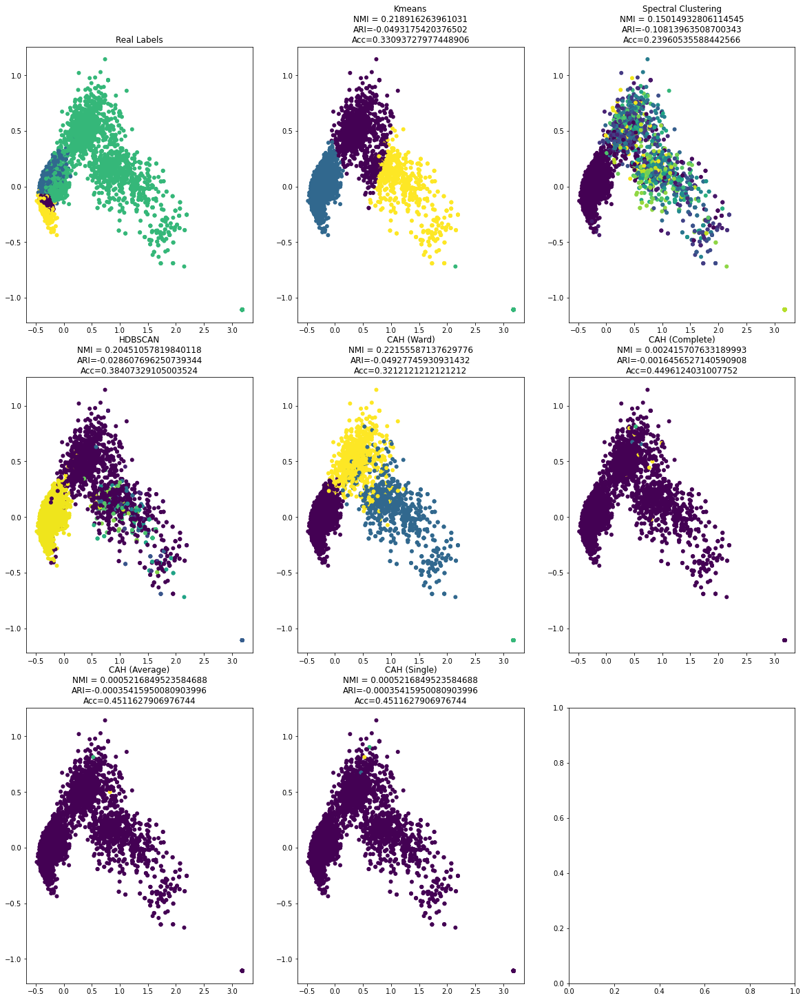

time: 2.19 s (started: 2021-12-04 17:24:53 +00:00)


In [80]:
results_classic4_redim["original"] = eval_clustering_2D(X_reduced, map_labels(classic4_labels), [kmeans_labels, spectral_labels, hdbscan_labels, cah_labels_ward, cah_labels_complete, cah_labels_average, cah_labels_single], ["Kmeans", "Spectral Clustering", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)"])

#### Espace Reduit

PCA avec 2 composantes

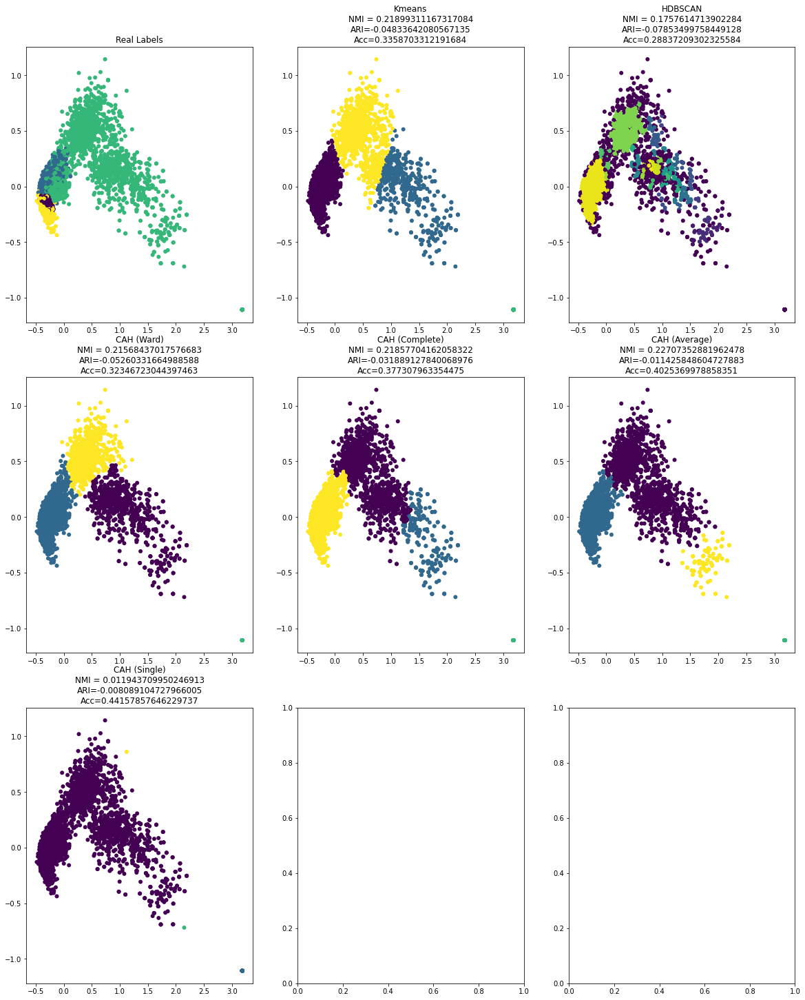

time: 6.8 s (started: 2021-12-04 17:24:55 +00:00)


In [81]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(classic4_word2vec)
results_classic4_redim['pca2'] = run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))

PCA avec 3 composantes

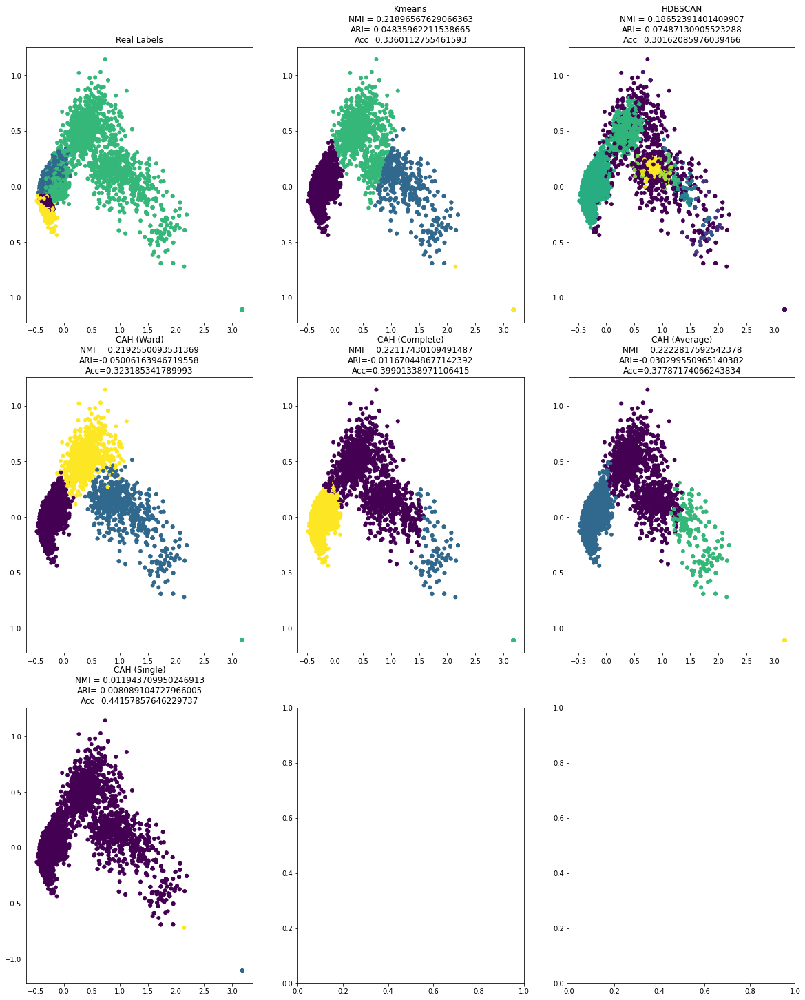

time: 7.03 s (started: 2021-12-04 17:25:04 +00:00)


In [82]:
X_reduced = PCA(n_components=3, random_state=42).fit_transform(classic4_word2vec)
results_classic4_redim['pca3'] = run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))

TSNE

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


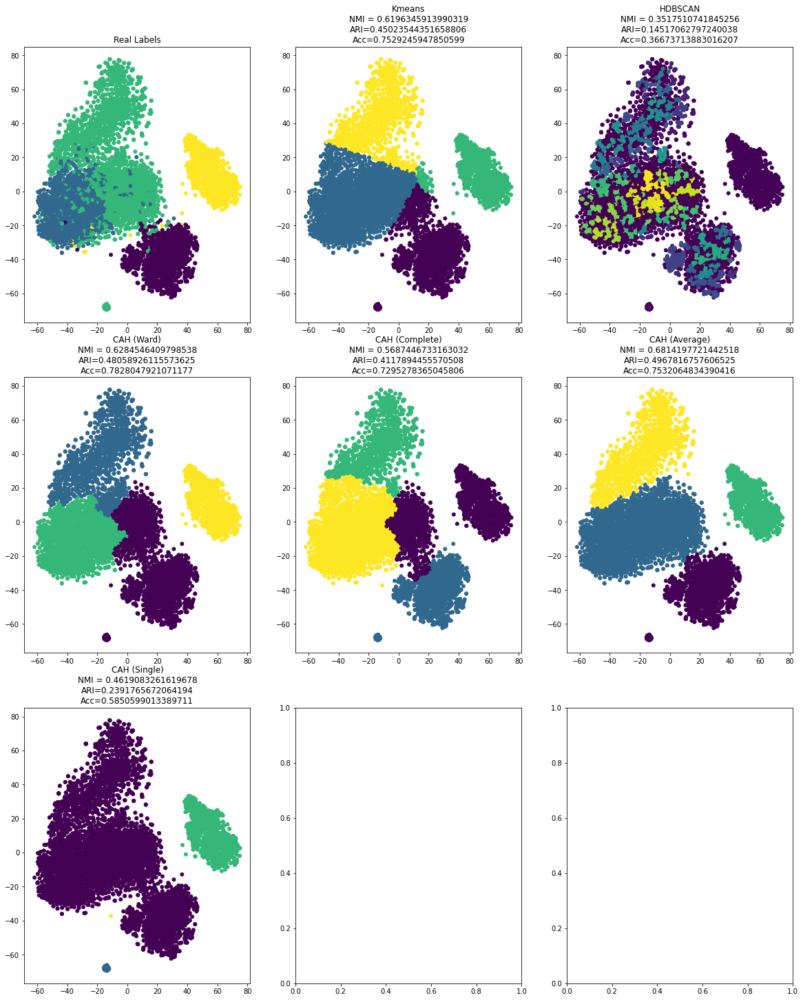

time: 1min 40s (started: 2021-12-04 17:25:11 +00:00)


In [83]:
X_reduced_tsne = TSNE(n_components=2, random_state=42).fit_transform(classic4_word2vec)
results_classic4_redim['tsne'] = run_clustering(X_reduced_tsne, k_classic4, map_labels(classic4_labels))

UMAP

In [84]:
X_reduced = UMAP(n_components=2, random_state=42).fit_transform(classic4_word2vec)

time: 23.2 s (started: 2021-12-04 17:26:52 +00:00)


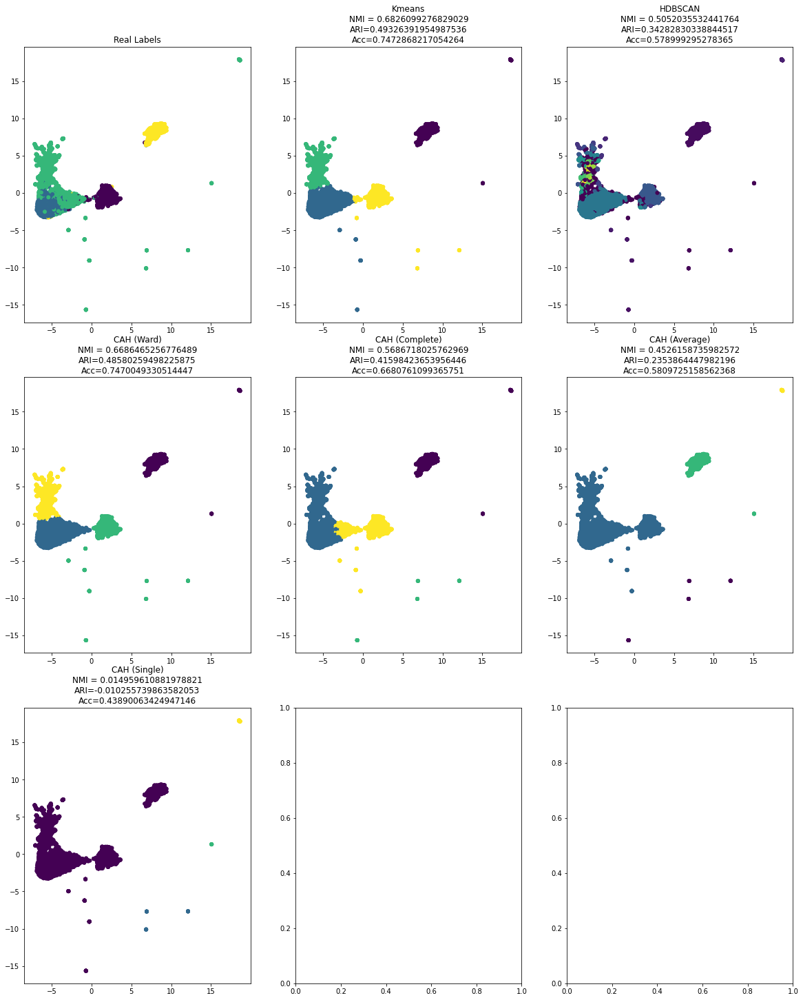

time: 6.11 s (started: 2021-12-04 17:27:15 +00:00)


In [85]:
results_classic4_redim['umap'] = run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))

Autoencoder

In [86]:
n_components=2
X_reduced = autoencoder(classic4_word2vec.astype("float32"), n_components, seed=42, learning_rate=1e-3)

100%|██████████| 50/50 [00:18<00:00,  2.72it/s]

time: 18.4 s (started: 2021-12-04 17:27:21 +00:00)


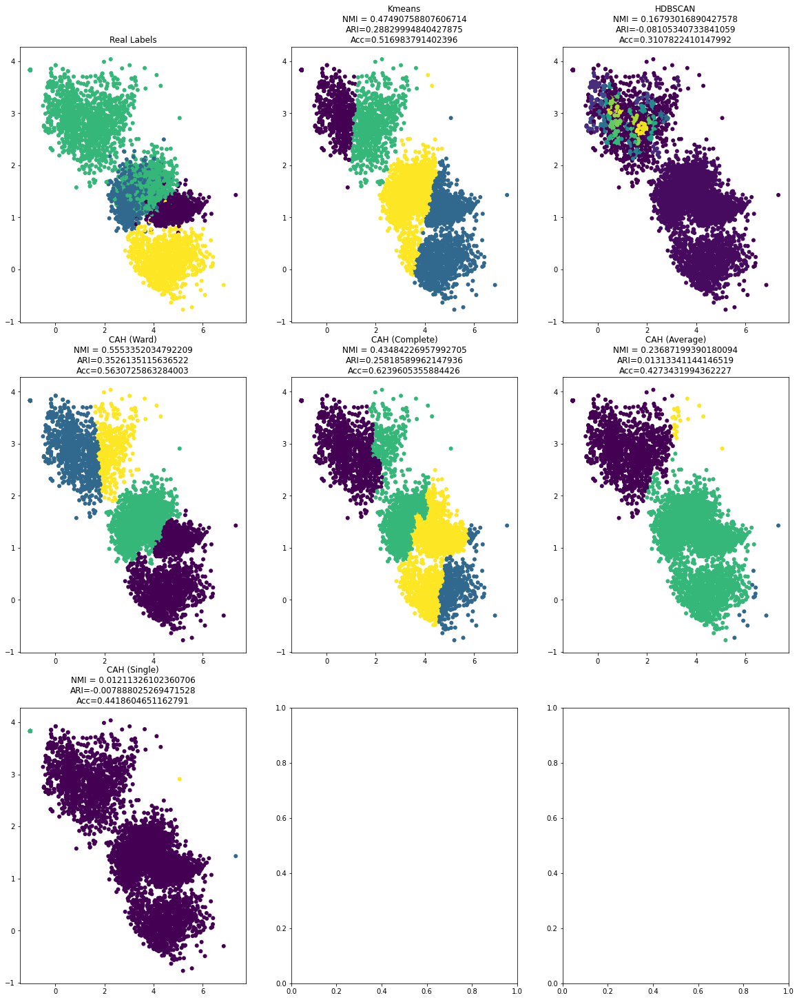

time: 6.22 s (started: 2021-12-04 17:27:40 +00:00)


In [87]:
results_classic4_redim['autoencoder'] = run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))

#### Interpretations des resultats 

In [93]:
from copy import deepcopy
results_temp = deepcopy(results_classic4_redim)
for method in results_temp:
    for result in results_temp[method]:
        nmi, ari, acc = results_temp[method][result]
        results_temp[method][result] = {
            'nmi': nmi,
            "ari": ari,
            'acc': acc
        }

time: 6.82 ms (started: 2021-12-04 17:34:04 +00:00)


In [116]:
results_word2vec_classic4 = pd.DataFrame.from_dict({(i,j): results_temp[i][j] 
                           for i in results_temp.keys() 
                           for j in results_temp[i].keys()},
                       orient='index')

time: 9.71 ms (started: 2021-12-04 17:50:24 +00:00)


Tableau des metriques

In [149]:
results_word2vec_classic4

nmi       ari       acc
original    Kmeans               0.218916 -0.049318  0.330937
            Spectral Clustering  0.150149 -0.108140  0.239605
            HDBSCAN              0.204511 -0.028608  0.384073
            CAH (Ward)           0.221556 -0.049277  0.321212
            CAH (Complete)       0.002416 -0.001646  0.449612
            CAH (Average)        0.000522 -0.000354  0.451163
            CAH (Single)         0.000522 -0.000354  0.451163
pca2        Kmeans               0.218993 -0.048336  0.335870
            HDBSCAN              0.175761 -0.078535  0.288372
            CAH (Ward)           0.215684 -0.052603  0.323467
            CAH (Complete)       0.218577 -0.031889  0.377308
            CAH (Average)        0.227074 -0.011426  0.402537
            CAH (Single)         0.011944 -0.008089  0.441579
pca3        Kmeans               0.218966 -0.048360  0.336011
            HDBSCAN              0.186524 -0.074871  0.301621
            CAH (Ward)           0.219255 -0.050062  0.323185
            CAH (Complete)       0.221174 -0.011670  0.399013
            CAH (Average)        0.222282 -0.030300  0.377872
            CAH (Single)         0.011944 -0.008089  0.441579
tsne        Kmeans               0.619635  0.450235  0.752925
            HDBSCAN              0.351751  0.145171  0.366737
            CAH (Ward)           0.628455  0.480589  0.782805
            CAH (Complete)       0.568745  0.411789  0.729528
            CAH (Average)        0.681420  0.496782  0.753206
            CAH (Single)         0.461908  0.239177  0.585060
umap        Kmeans               0.682610  0.493264  0.747287
            HDBSCAN              0.505204  0.342828  0.578999
            CAH (Ward)           0.668647  0.485803  0.747005
            CAH (Complete)       0.568672  0.415984  0.668076
            CAH (Average)        0.452616  0.235386  0.580973
            CAH (Single)         0.014960 -0.010256  0.438901
autoencoder Kmeans               0.474908  0.288300  0.516984
            HDBSCAN              0.167930 -0.081053  0.310782
            CAH (Ward)           0.555335  0.352614  0.563073
            CAH (Complete)       0.434842  0.258186  0.623961
            CAH (Average)        0.236872  0.013133  0.427343
            CAH (Single)         0.012113 -0.007888  0.441860

time: 32.2 ms (started: 2021-12-04 18:18:10 +00:00)


Les meilleurs methodes selon les 3 metriques

In [127]:
metric = "ari"
results_word2vec_classic4[results_word2vec_classic4[metric] == results_word2vec_classic4[metric].max()]

,,nmi,ari,acc
tsne,CAH (Average),0.68142,0.496782,0.753206


time: 26.9 ms (started: 2021-12-04 17:53:04 +00:00)


In [151]:
metric = "nmi"
results_word2vec_classic4[results_word2vec_classic4[metric] == results_word2vec_classic4[metric].max()]

,,nmi,ari,acc
umap,Kmeans,0.68261,0.493264,0.747287


time: 24.2 ms (started: 2021-12-04 18:22:03 +00:00)


In [152]:
metric = "acc"
results_word2vec_classic4[results_word2vec_classic4[metric] == results_word2vec_classic4[metric].max()]

,,nmi,ari,acc
tsne,CAH (Ward),0.628455,0.480589,0.782805


time: 21.6 ms (started: 2021-12-04 18:22:09 +00:00)


Le meilleur compromi c'est le CAH (Average) avec TSNE

In [153]:
X_reduced_tsne = TSNE(n_components=2, random_state=42).fit_transform(classic4_word2vec)
cah_labels_average = AgglomerativeClustering(n_clusters=k_classic4, linkage="average").fit_predict(X_reduced_tsne)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


time: 1min 37s (started: 2021-12-04 18:22:39 +00:00)


In [165]:
from wordcloud import WordCloud, STOPWORDS
def print_wordcloud(X, labels):
    temp_df = pd.DataFrame({
        "text": X,
        "labels": labels
    })
    for label in temp_df['labels'].unique():
        alltext = ' '.join(temp_df[temp_df['labels']== label]['text'])
        wordcloud = WordCloud().generate(alltext)
        # Display the generated image:
        print(f'Class: {label}')
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.show()
        print(f'\n')

time: 10.8 ms (started: 2021-12-04 18:30:09 +00:00)


Visualization des wordclouds du meilleur clustering

Class: 3


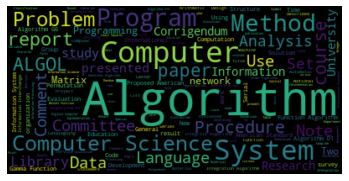



Class: 1


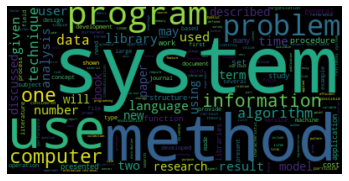



Class: 2


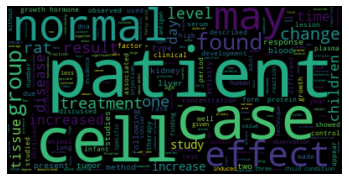



Class: 0


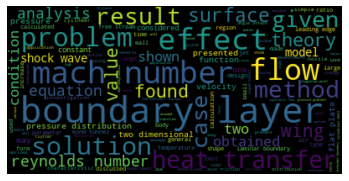



time: 6.01 s (started: 2021-12-04 18:30:11 +00:00)


In [166]:
print_wordcloud(df['text'].values, cah_labels_average)

### GloVe

#### Espace Original

In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(classic4_glove)
kmeans_labels = KMeans(k_classic4, random_state=42).fit(classic4_glove).labels_
spectral_labels = SpectralClustering(k_classic4, n_components= classic4_glove.shape[1], assign_labels="discretize", random_state=42).fit(classic4_glove).labels_
hdbscan_labels = hdbscan.HDBSCAN(algorithm="best", alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(classic4_glove).labels_
cah_labels_ward = AgglomerativeClustering(n_clusters=k_classic4).fit_predict(classic4_glove)
cah_labels_complete = AgglomerativeClustering(n_clusters=k_classic4, linkage="complete").fit_predict(classic4_glove)
cah_labels_average = AgglomerativeClustering(n_clusters=k_classic4, linkage="average").fit_predict(classic4_glove)
cah_labels_single = AgglomerativeClustering(n_clusters=k_classic4, linkage="single").fit_predict(classic4_glove)

In [ ]:
eval_clustering_2D(X_reduced, map_labels(classic4_labels), [kmeans_labels, spectral_labels, hdbscan_labels, cah_labels_ward, cah_labels_complete, cah_labels_average, cah_labels_single], ["Kmeans", "Spectral Clustering", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)"])

#### Espace Reduit

PCA avec 2 composantes

In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(classic4_glove)

time: 274 ms (started: 2021-12-04 17:04:15 +00:00)


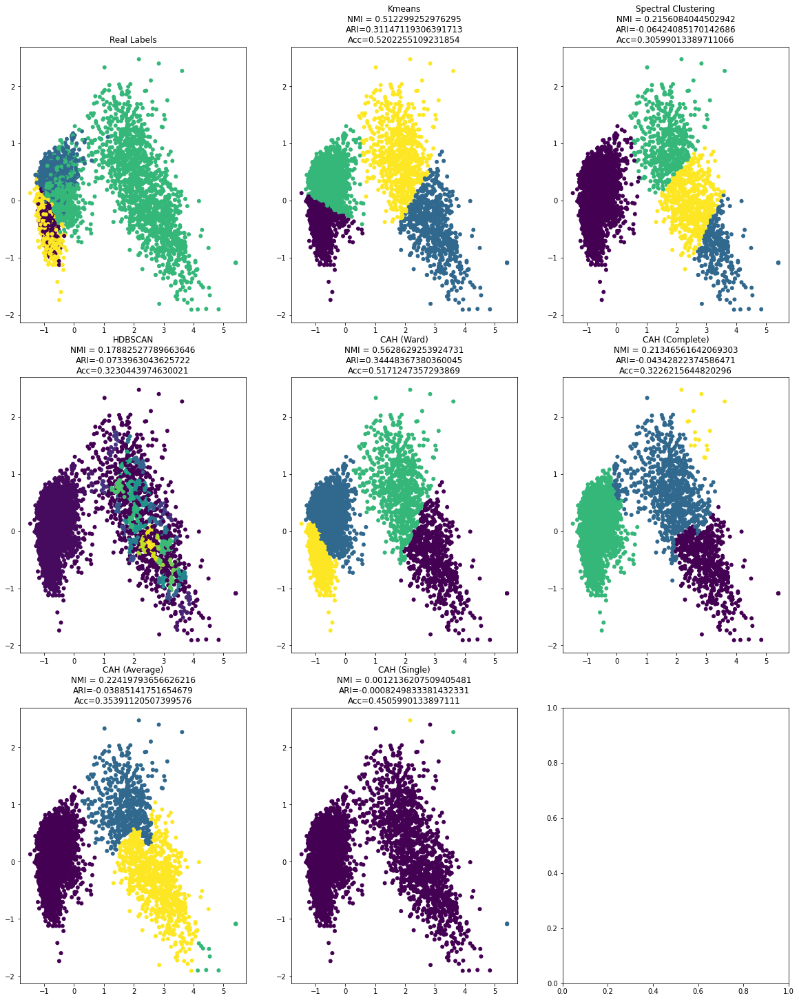

time: 21.2 s (started: 2021-12-04 17:04:16 +00:00)


In [ ]:
run_clustering(X_reduced, k_classic4, map_labels(classic4_labels), spectral=True)

TSNE

In [ ]:
X_reduced = TSNE(n_components=2, random_state=42).fit_transform(classic4_glove)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


time: 1min 38s (started: 2021-12-04 17:04:41 +00:00)


In [56]:
run_clustering(X_reduced, k_classic4, map_labels(classic4_labels), spectral=True)

KeyboardInterrupt: ignored

time: 1min 24s (started: 2021-12-04 17:06:21 +00:00)


UMAP

In [57]:
X_reduced = UMAP(n_components=2, random_state=42).fit_transform(classic4_glove)

time: 42.8 s (started: 2021-12-04 17:08:01 +00:00)


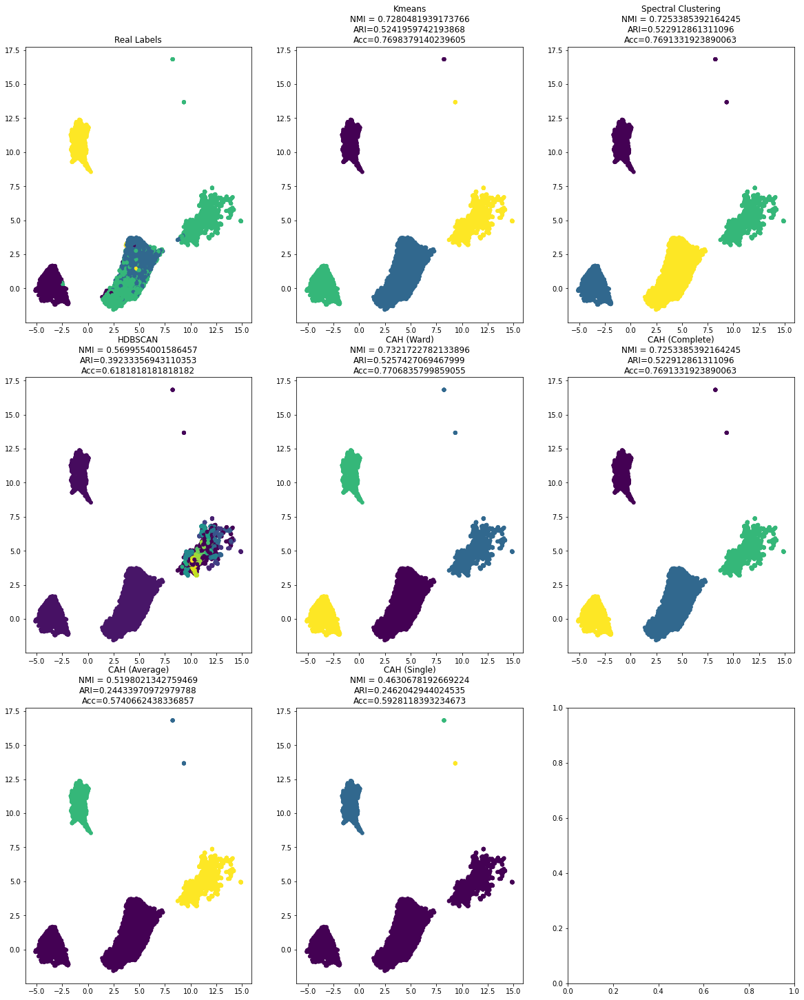

time: 20.6 s (started: 2021-12-04 17:08:44 +00:00)


In [58]:
run_clustering(X_reduced, k_classic4, map_labels(classic4_labels), spectral=True)

Autoencoder

In [59]:
X_reduced = autoencoder(classic4_glove.astype("float32"), n_components, seed=42)

100%|██████████| 50/50 [00:17<00:00,  2.78it/s]

time: 18.1 s (started: 2021-12-04 17:09:04 +00:00)


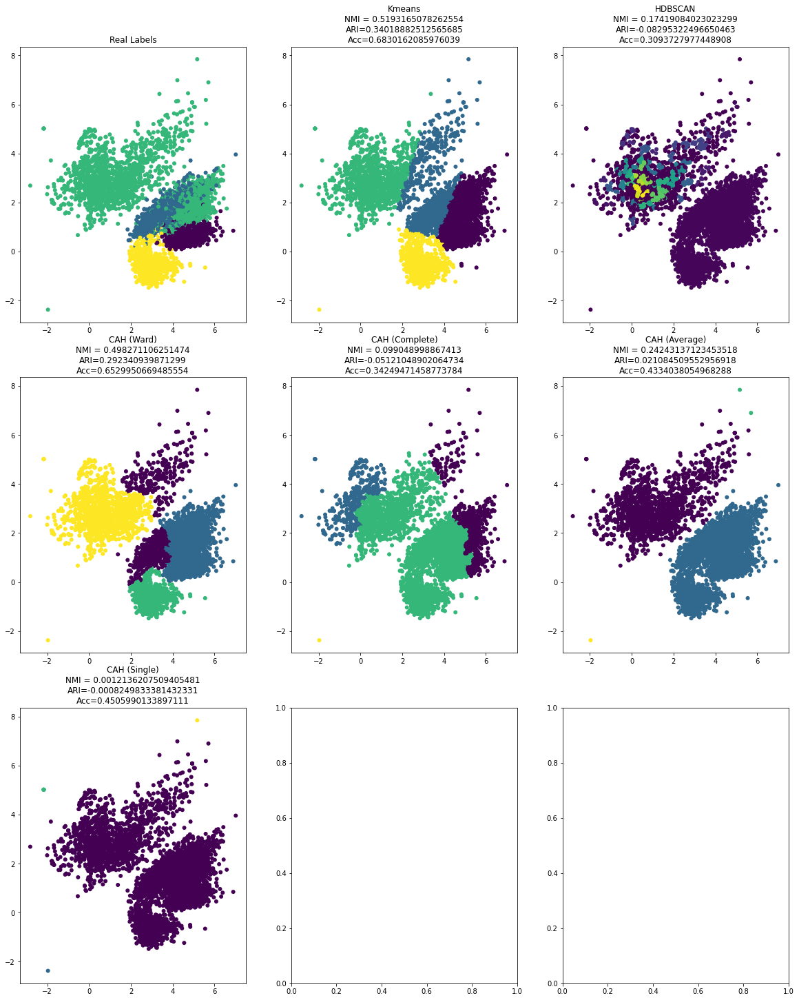

time: 6.76 s (started: 2021-12-04 17:09:22 +00:00)


In [60]:
run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))

## BBC

### word2vec

#### Espace Original

In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(bbc_word2vec)
kmeans_labels = KMeans(k_bbc, random_state=42).fit(bbc_word2vec).labels_
spectral_labels = SpectralClustering(k_bbc, n_components= bbc_word2vec.shape[1], assign_labels="discretize", random_state=42).fit(bbc_word2vec).labels_
hdbscan_labels = hdbscan.HDBSCAN(algorithm="best", alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(bbc_word2vec).labels_
cah_labels_ward = AgglomerativeClustering(n_clusters=k_bbc).fit_predict(bbc_word2vec)
cah_labels_complete = AgglomerativeClustering(n_clusters=k_bbc, linkage="complete").fit_predict(bbc_word2vec)
cah_labels_average = AgglomerativeClustering(n_clusters=k_bbc, linkage="average").fit_predict(bbc_word2vec)
cah_labels_single = AgglomerativeClustering(n_clusters=k_bbc, linkage="single").fit_predict(bbc_word2vec)



time: 11.4 s (started: 2021-12-04 16:41:44 +00:00)


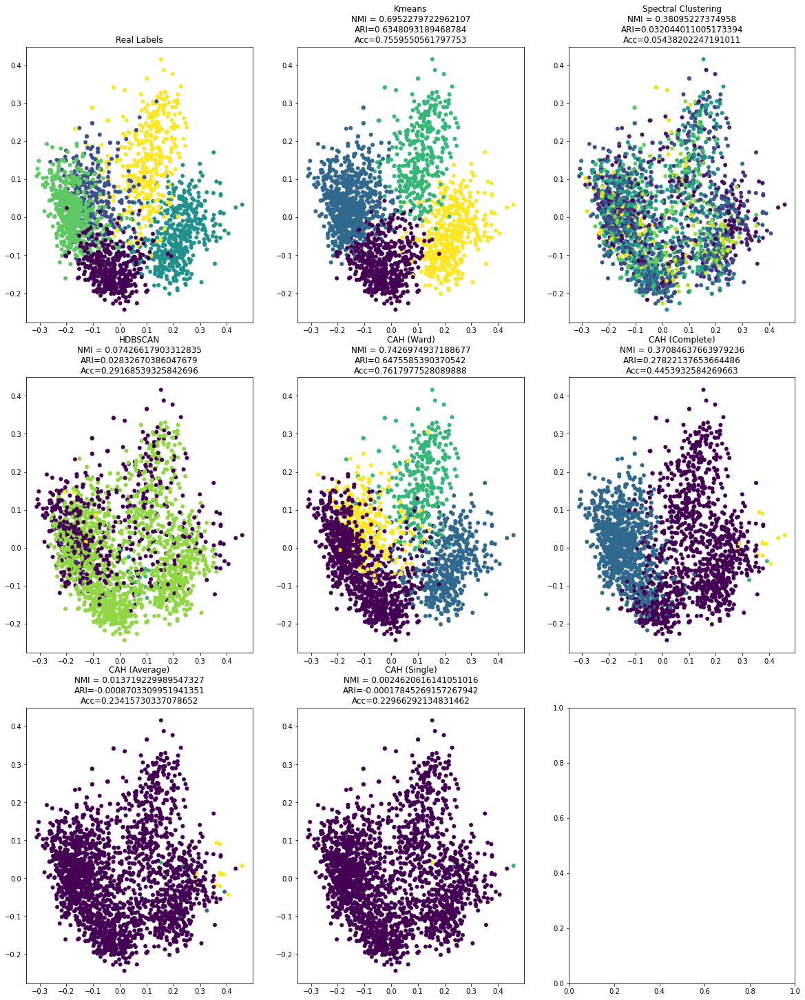

time: 2.39 s (started: 2021-12-04 16:41:57 +00:00)


In [ ]:
eval_clustering_2D(X_reduced, map_labels(bbc_labels), [kmeans_labels, spectral_labels, hdbscan_labels, cah_labels_ward, cah_labels_complete, cah_labels_average, cah_labels_single], ["Kmeans", "Spectral Clustering", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)"])

#### Espace Reduit

PCA avec 2 composantes

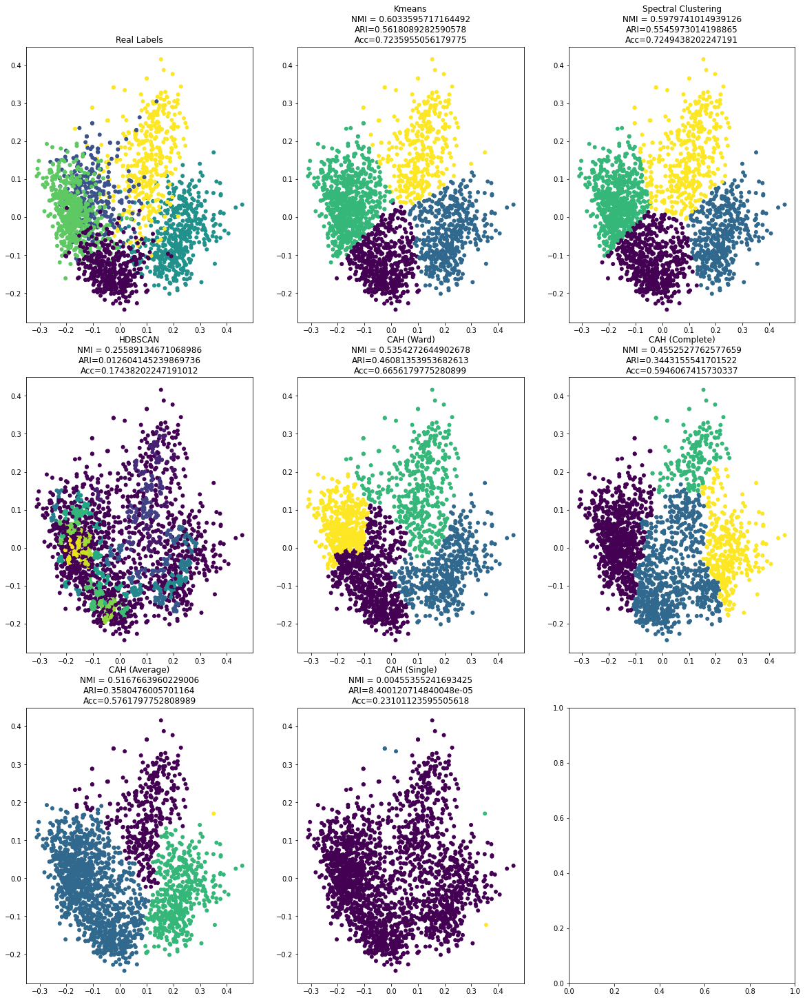

time: 3.67 s (started: 2021-12-04 16:48:24 +00:00)


In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(bbc_word2vec)
run_clustering(X_reduced, k_bbc, map_labels(bbc_labels), spectral=True)

PCA avec 3 composantes

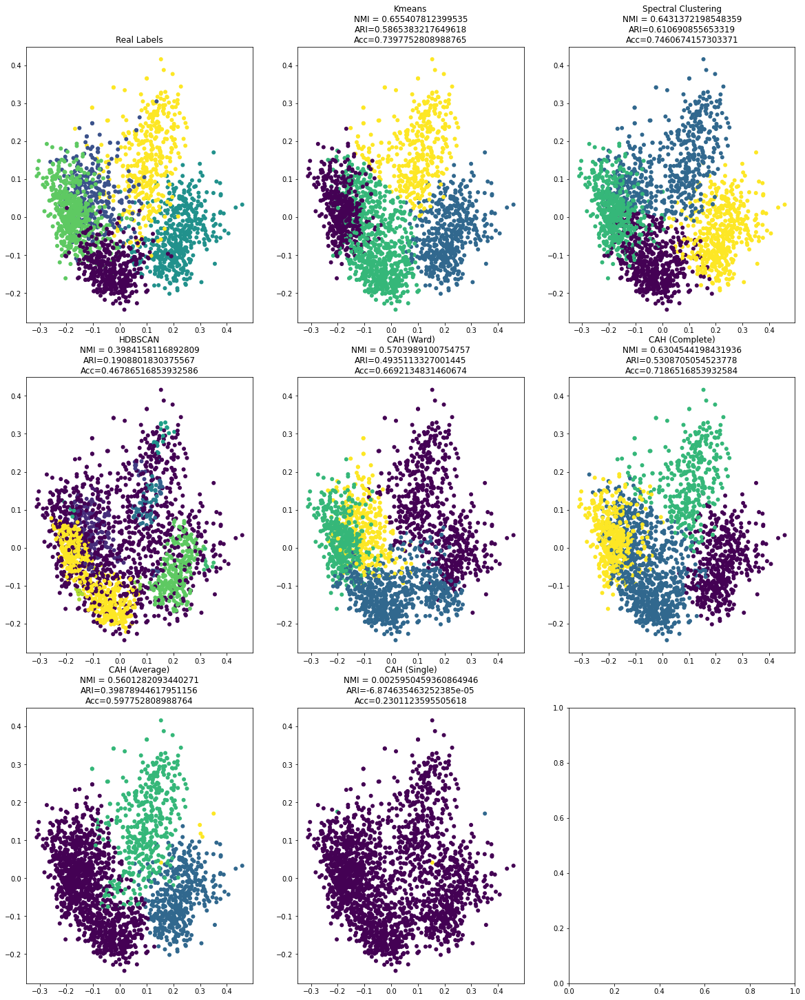

time: 3.71 s (started: 2021-12-04 16:48:59 +00:00)


In [ ]:
X_reduced = PCA(n_components=3, random_state=42).fit_transform(bbc_word2vec)
run_clustering(X_reduced, k_bbc, map_labels(bbc_labels), spectral=True)

TSNE

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


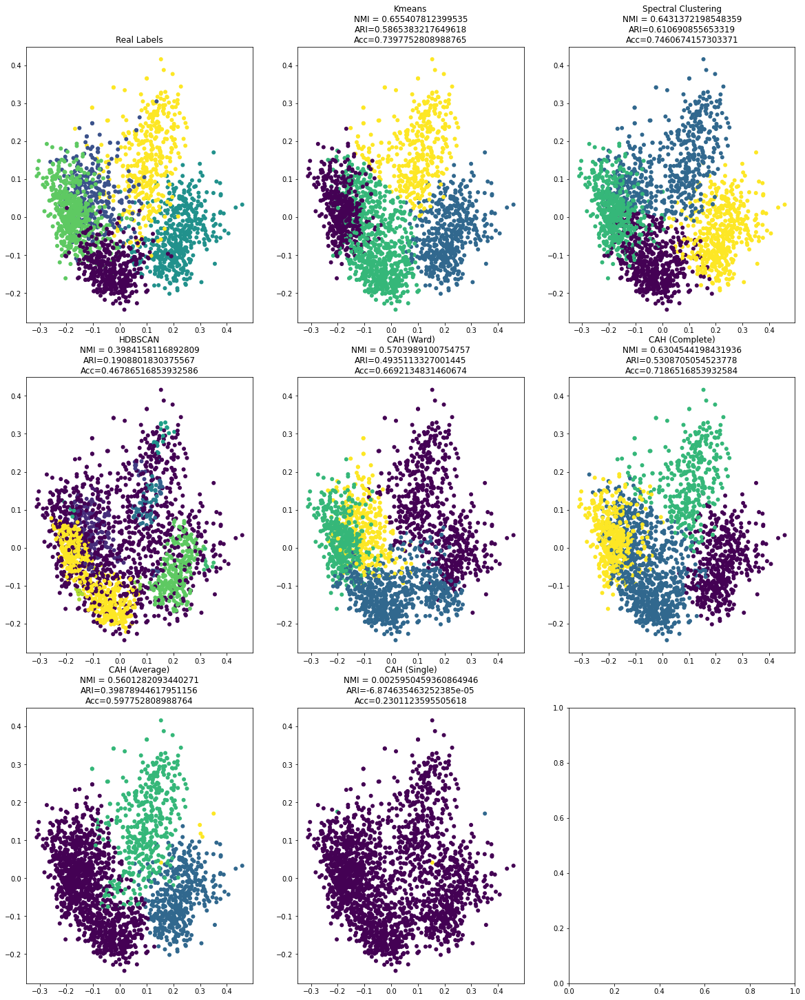

time: 23.5 s (started: 2021-12-04 16:49:13 +00:00)


In [ ]:
X_reduced_tsne = TSNE(n_components=2, random_state=42).fit_transform(bbc_word2vec)
run_clustering(X_reduced, k_bbc, map_labels(bbc_labels), spectral=True)

UMAP

In [ ]:
X_reduced = UMAP(n_components=2, random_state=42).fit_transform(bbc_word2vec)

/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


time: 16.9 s (started: 2021-12-04 16:49:38 +00:00)


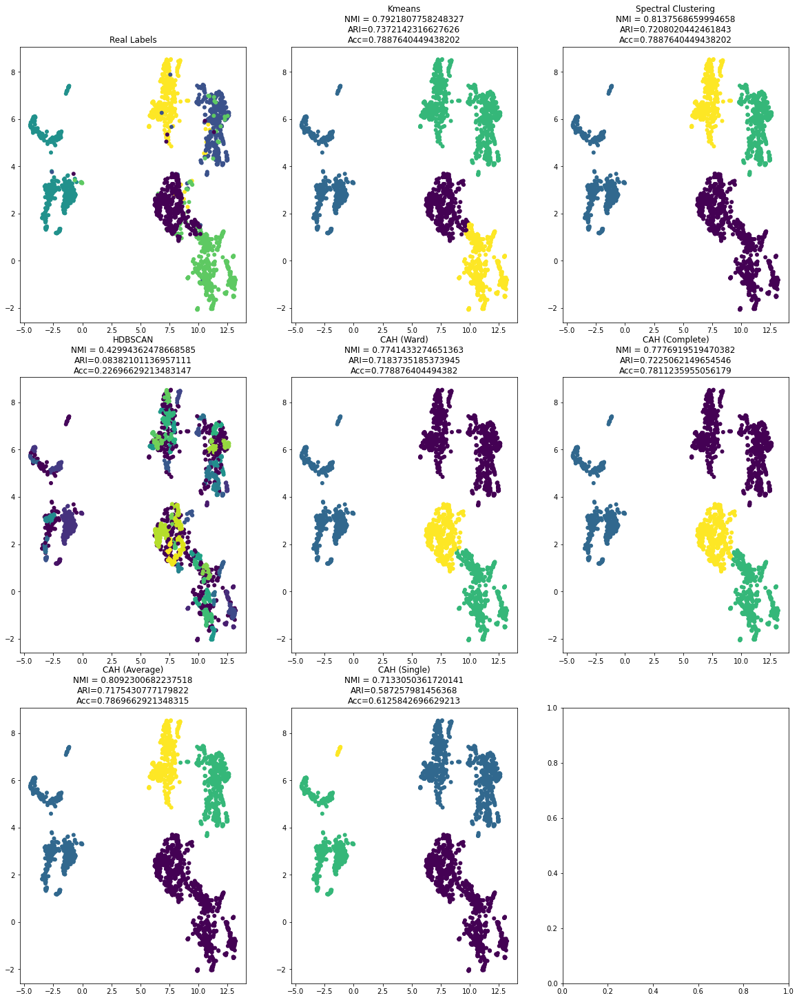

time: 4.09 s (started: 2021-12-04 16:49:55 +00:00)


In [ ]:
run_clustering(X_reduced, k_bbc, map_labels(bbc_labels), spectral=True)

Autoencoder

In [ ]:
n_components=2
X_reduced = autoencoder(bbc_word2vec.astype("float32"), n_components, seed=42, learning_rate=1e-3)

100%|██████████| 50/50 [00:06<00:00,  8.30it/s]

time: 17.1 s (started: 2021-12-04 16:50:46 +00:00)


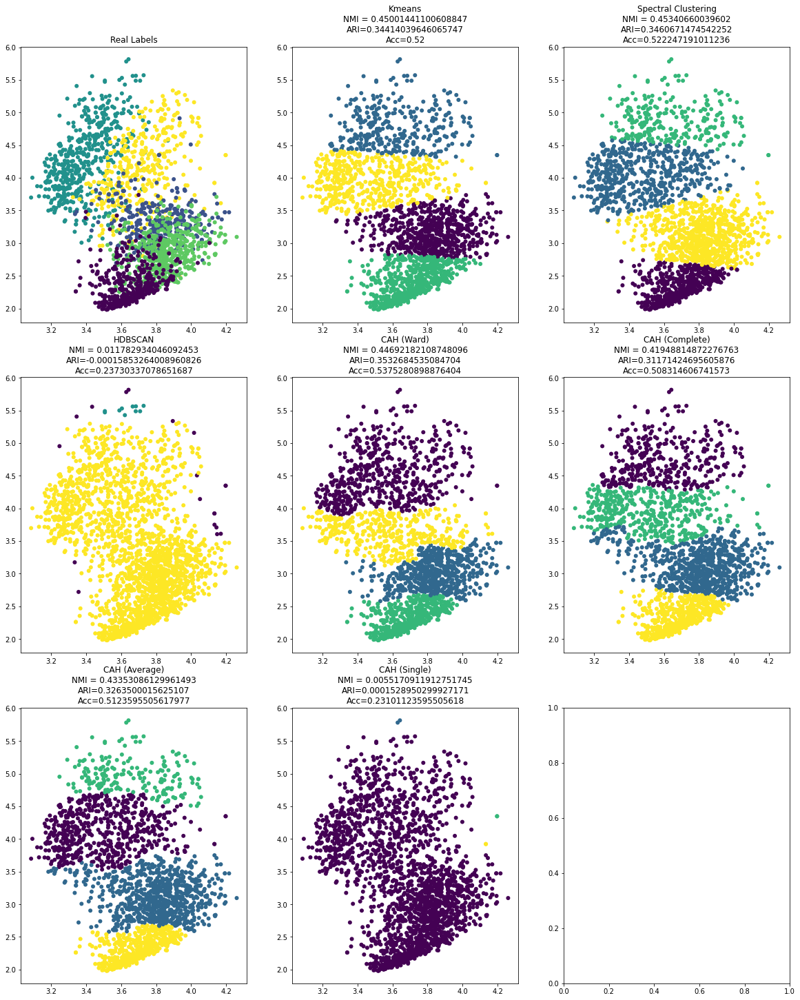

time: 3.5 s (started: 2021-12-04 16:51:03 +00:00)


In [ ]:
run_clustering(X_reduced, k_bbc, map_labels(bbc_labels), spectral=True)

### GloVe

#### Espace Original

In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(bbc_glove)
kmeans_labels = KMeans(k_bbc, random_state=42).fit(bbc_glove).labels_
spectral_labels = SpectralClustering(k_bbc, n_components= bbc_glove.shape[1], assign_labels="discretize", random_state=42).fit(bbc_glove).labels_
hdbscan_labels = hdbscan.HDBSCAN(algorithm="best", alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(bbc_glove).labels_
cah_labels_ward = AgglomerativeClustering(n_clusters=k_bbc).fit_predict(bbc_glove)
cah_labels_complete = AgglomerativeClustering(n_clusters=k_bbc, linkage="complete").fit_predict(bbc_glove)
cah_labels_average = AgglomerativeClustering(n_clusters=k_bbc, linkage="average").fit_predict(bbc_glove)
cah_labels_single = AgglomerativeClustering(n_clusters=k_bbc, linkage="single").fit_predict(bbc_glove)

time: 13.8 s (started: 2021-12-04 16:51:30 +00:00)


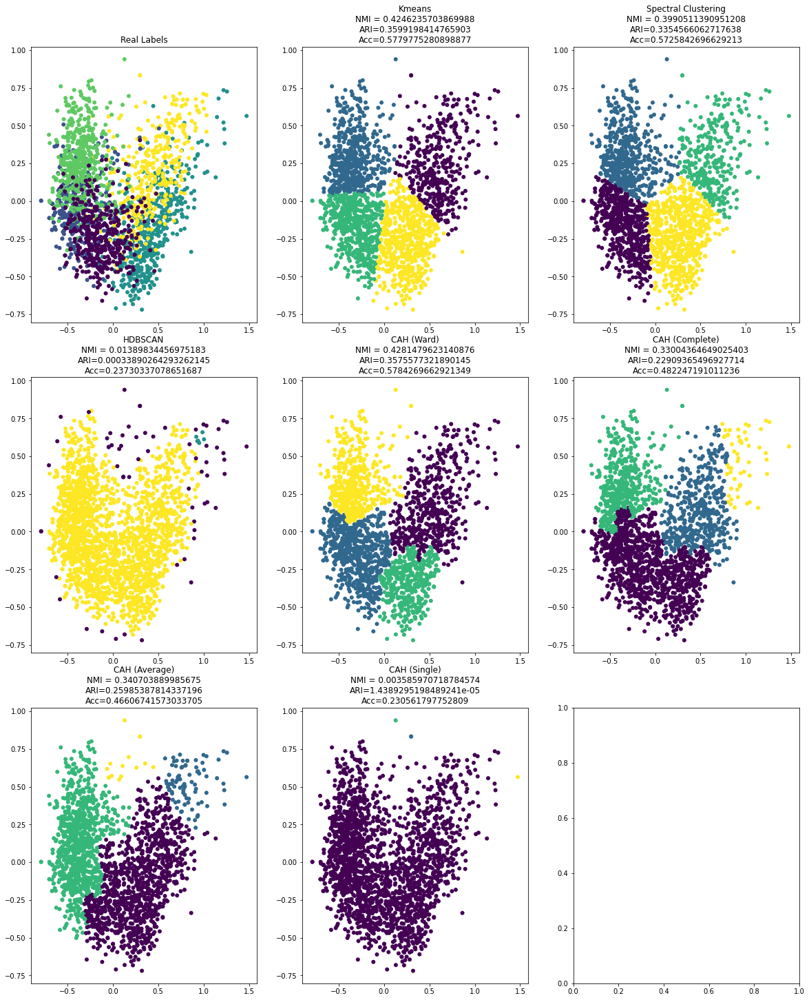

time: 3.52 s (started: 2021-12-04 16:51:45 +00:00)


In [ ]:
run_clustering(X_reduced, k_bbc, map_labels(bbc_labels), spectral=True)

#### Espace Reduit

PCA avec 2 composantes

In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(bbc_glove)

time: 46.4 ms (started: 2021-12-04 16:52:37 +00:00)


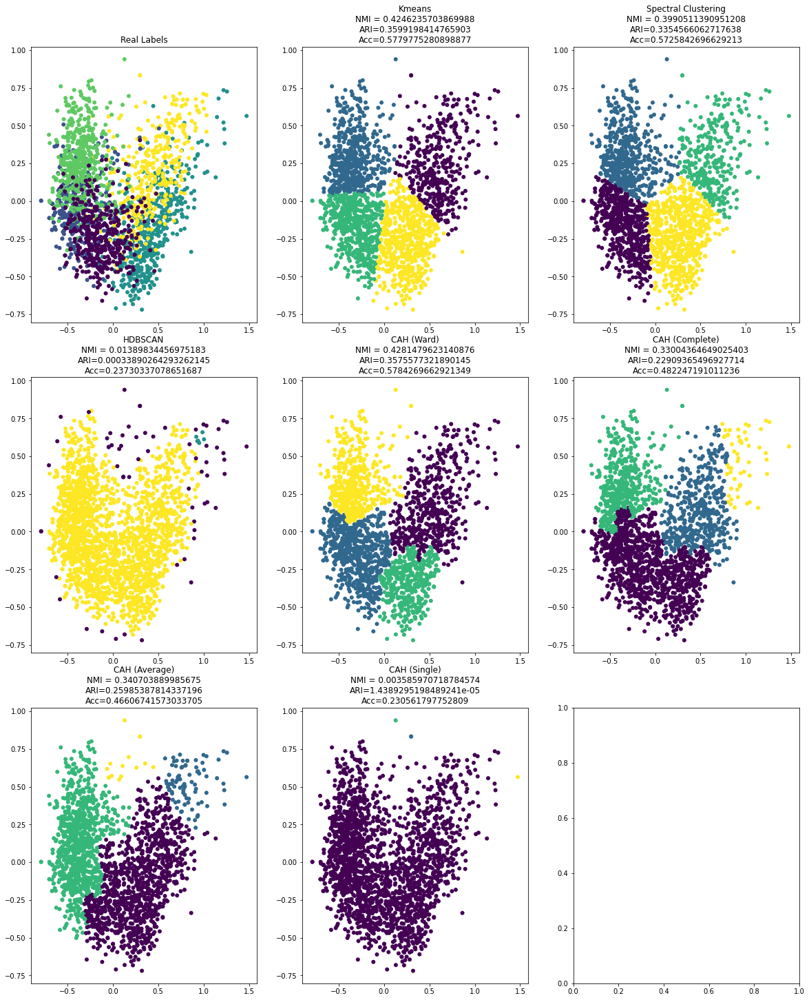

time: 3.59 s (started: 2021-12-04 16:52:39 +00:00)


In [ ]:
run_clustering(X_reduced, k_bbc, map_labels(bbc_labels), spectral=True)

TSNE

In [ ]:
X_reduced = TSNE(n_components=2, random_state=42).fit_transform(bbc_glove)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


time: 18.7 s (started: 2021-12-04 17:02:42 +00:00)


In [ ]:
run_clustering(X_reduced, k_bbc, map_labels(bbc_labels), spectral=True)

KeyboardInterrupt: ignored

time: 35.9 s (started: 2021-12-04 17:03:26 +00:00)


UMAP

In [ ]:
X_reduced = UMAP(n_components=2, random_state=42).fit_transform(bbc_glove)

time: 10.1 s (started: 2021-12-04 17:01:55 +00:00)


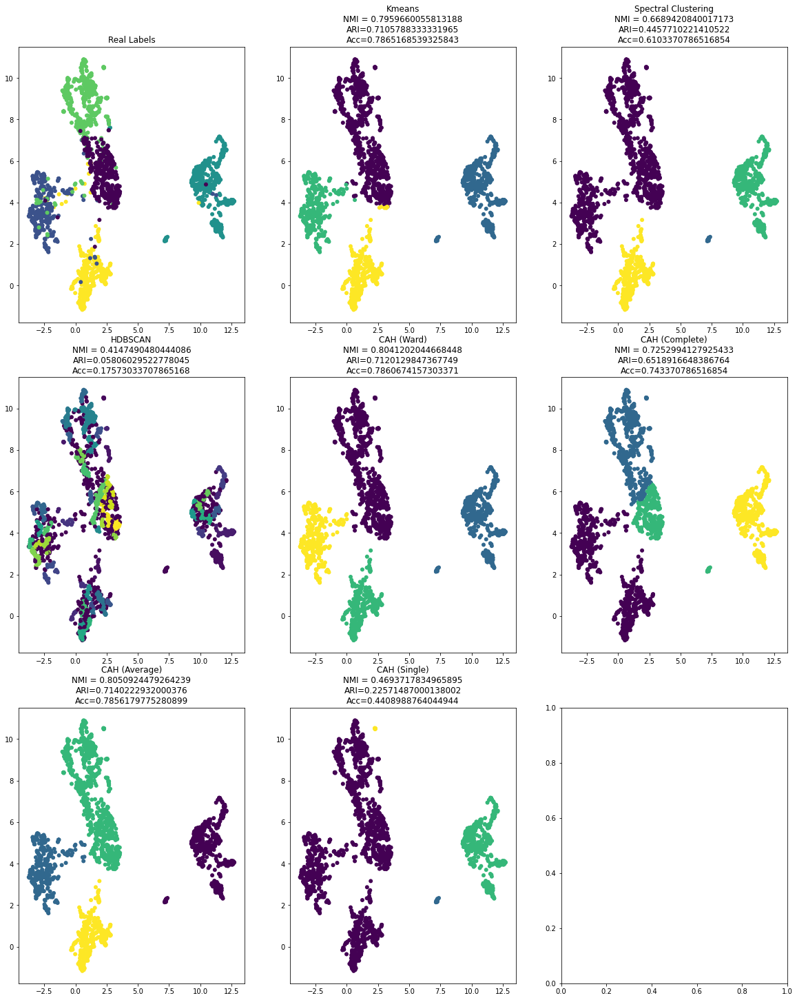

time: 3.87 s (started: 2021-12-04 17:02:05 +00:00)


In [ ]:
run_clustering(X_reduced, k_bbc, map_labels(bbc_labels), spectral=True)

Autoencoder

In [ ]:
X_reduced = autoencoder(bbc_glove.astype("float32"), n_components, seed=42)

100%|██████████| 50/50 [00:05<00:00,  8.49it/s]

time: 5.92 s (started: 2021-12-04 17:02:15 +00:00)


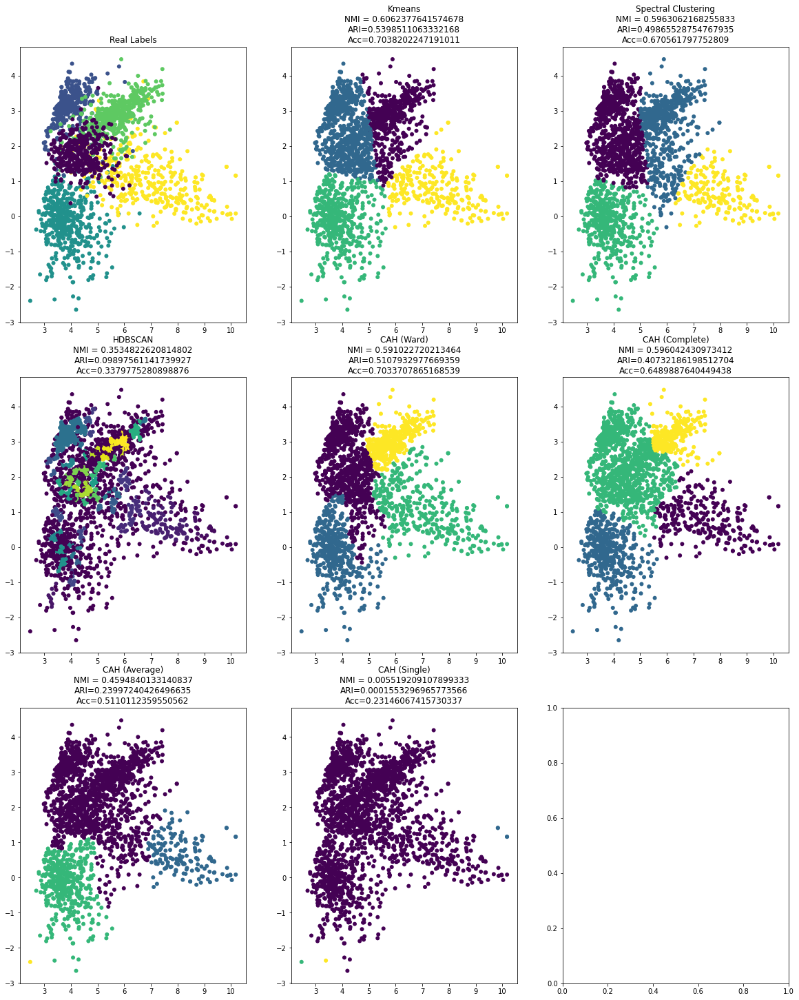

time: 3.56 s (started: 2021-12-04 17:02:21 +00:00)


In [ ]:
run_clustering(X_reduced, k_bbc, map_labels(bbc_labels), spectral=True)